# Open Street Map

## 繪製HOT Tasking Manager Project 16316
![Hot_Tasking_project_16316](OSM-pic/Hot_Tasking_project_16316.png)

![Hot_Tasking_fin_task](OSM-pic/Hot_Tasking_fin_task.png)

## Overpass API

### 作業主題
台北大眾運輸

### 內容呈現
因為最近[*新聞*](https://www.youtube.com/watch?v=sGIOF08AUH4&ab_channel=TVBSNEWS)常在報導台北市大眾運輸的使用率與使用宣導，政府為達成綠色交通的目標推動了多項政策，其中北北基月票鼓勵群眾搭乘包含公車、捷運、火車、高鐵、Youbike等多項大眾運輸，對我影響較大，所以我想調查台北的大眾運輸分布、密集程度，看看目前大眾運輸是否是充足的、哪邊分布較低可能促使民眾不願採用其作為交通的一環。

### 使用資料
+ [Youbike站點台北分布](https://overpass-turbo.eu/s/1OCj)
+ [MRT站點台北分布](https://overpass-turbo.eu/s/1OCk)
+ [公車站點台北分布](https://overpass-turbo.eu/s/1OCl)
+ [火車站點台北分布](https://overpass-turbo.eu/s/1P3r)
+ 經緯度[ 25.0369, 121.5641 ] 台北openstreetmap式地圖

### 詳細工作
1. 查詢overpass amenity 的 [value 有哪些](https://wiki.openstreetmap.org/wiki/Key:amenity)，並決定做台北大眾運輸
2. 從overpass匯入bicycle_rental、railway、bus_stop,rail的資料，為過濾掉非Youbike的，將營運商限定為YOUBIKE CO.，捷運則是限定railway = subway，而火車則是限定名稱是台鐵，並輸出全部資料
3. 印出Youbike、火車、捷運與公車的個別站點資訊
4. 用Folium製作台北大眾運輸地圖
5. 利用迴圈擷取先前Youbike、MRT、公車、火車經緯度與名稱資料標記位置於地圖
6. 給label加入[內建Icon](https://fontawesome.com/search?m=free&o=r)跟顏色
7. 利用每個站點的經緯資訊繪製北大中運輸的密度圖
8. 因為overpass匯入的資料輸出很雜又多，所以上網尋找了製作成卷軸的辦法，並改寫套入
9. 因為jupyter notebook的地圖在github上顯示不出來，嘗試將圖片存成html檔輸出，仍無法顯示，但保留html檔輸出供檢視
### 結果呈現

In [1]:
# pip install pandas requests
# pip install ipywidgets

In [2]:
import requests
import json
import pandas as pd
from IPython.display import display
from IPython.core.display import HTML
import ipywidgets as wdgets

In [3]:
# Define a function to display DataFrame in a scrollable HTML container
def display_scrollable_dataframe(df, max_height=400):
    html = df.to_html(classes='table table-striped')
    style = f"""
    <style>
    .dataframe-div {{
        height: {max_height}px;
        overflow: auto;
        border: 1px solid black;
    }}
    </style>
    """
    display(HTML(style + f'<div class="dataframe-div">{html}</div>'))


In [4]:
overpass_url = "http://overpass-api.de/api/interpreter"
overpass_query = """
[out:json];
area["name:en"="Taipei"];
(node["amenity"="bicycle_rental"]["network:en"="Taipei City Public Bike"]["operator:en"="YOUBIKE CO."](area);
 way["amenity"="bicycle_rental"]["network:en"="Taipei City Public Bike"]["operator:en"="YOUBIKE CO."](area);
 rel["amenity"="bicycle_rental"]["network:en"="Taipei City Public Bike"]["operator:en"="YOUBIKE CO."](area);
);
out center;
"""

response = requests.get(overpass_url, params={'data': overpass_query})
data_bike = response.json()
# convert Json to data frame
elem_bike = data_bike.get('elements',[])
df_bike = pd.json_normalize(elem_bike)

# Display the scrollable DataFrame
display_scrollable_dataframe(df_bike)

,type,id,lat,lon,tags.alt_name,tags.alt_name:en,tags.alt_name:zh,tags.alt_name:zh-Hans,tags.alt_name:zh-Hant,tags.alt_name:zh_pinyin,tags.alt_name:zh_zhuyin,tags.amenity,tags.authentication:app,tags.authentication:contactless,tags.authentication:membership_card,tags.bicycle_rental,tags.brand,tags.brand:en,tags.brand:wikidata,tags.brand:wikipedia,tags.brand:zh,tags.capacity,tags.description,tags.description:en,tags.description:zh,tags.description:zh-Hans,tags.description:zh-Hant,tags.fee,tags.name,tags.name:en,tags.name:zh,tags.name:zh-Hans,tags.name:zh-Hant,tags.name:zh_pinyin,tags.name:zh_zhuyin,tags.nat_ref,tags.network,tags.network:en,tags.network:wikidata,tags.network:zh,tags.opening_hours,tags.operator,tags.operator:en,tags.operator:type,tags.operator:wikidata,tags.operator:zh,tags.payment:credit_cards,tags.payment:ep_easycard,tags.payment:ep_easywallet,tags.payment:ep_ipass,tags.payment:jcb,tags.payment:mastercard,tags.payment:visa,tags.ref,tags.rental,tags.source,tags.start_date,tags.old_alt_name,tags.old_alt_name:en,tags.old_alt_name:zh,tags.old_alt_name:zh-Hans,tags.old_alt_name:zh-Hant,tags.old_name,tags.old_name:en,tags.old_name:zh,tags.old_name:zh-Hans,tags.old_name:zh-Hant,tags.alt_name:nan,tags.alt_name:nan-HJ,tags.alt_name:nan-POJ,tags.alt_name:nan-TL,tags.description:nan,tags.description:nan-HJ,tags.description:nan-POJ,tags.description:nan-TL,tags.name:nan,tags.name:nan-HJ,tags.name:nan-POJ,tags.name:nan-TL,tags.source:date,tags.wheelchair,tags.check_date,tags.covered,tags.payment:cards,tags.payment:debit_cards,tags.old_alt_name:zh_pinyin,tags.old_alt_name:zh_zhuyin,tags.old_name:zh_pinyin,tags.old_name:zh_zhuyin
0,node,8256951618,25.019000,121.543050,YouBike2.0_臺大鄭江樓北側,YouBike2.0_NTU Tseng Jiang Hall(North),YouBike2.0_臺大鄭江樓北側,YouBike2.0_台大郑江楼北侧,YouBike2.0_臺大鄭江樓北側,YouBike2.0_táidàzhèngjiānglóuběicè,YouBike2.0_ㄊㄞˊㄉㄚˋㄓㄥˋㄐㄧㄤㄌㄡˊㄅㄟˇㄘㄜˋ,bicycle_rental,yes,yes,yes,docking_station,YouBike 2.0,YouBike 2.0,Q20687952,en:YouBike,微笑單車2.0,10,臺大新聞研究所南側,NTU Graduate Institute of Journalism(South),臺大新聞研究所南側,台大新闻研究所南侧,臺大新聞研究所南側,yes,臺大鄭江樓北側,NTU Tseng Jiang Hall(North),臺大鄭江樓北側,台大郑江楼北侧,臺大鄭江樓北側,táidàzhèngjiānglóuběicè,ㄊㄞˊㄉㄚˋㄓㄥˋㄐㄧㄤㄌㄡˊㄅㄟˇㄘㄜˋ,TPE500119084,臺北市公共自行車租賃系統,Taipei City Public Bike,Q20687952,臺北市公共自行車租賃系統,24/7,微笑單車股份有限公司,YOUBIKE CO.,government,Q703557,微笑單車股份有限公司,yes,yes,yes,yes,yes,yes,yes,500119084,city_bike,YouBike;臺北市政府,2020-01-15 10:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node,8256951619,25.021080,121.537830,YouBike2.0_臺大天文數學館南側,YouBike2.0_NTU Astronomy - Mathematics Building(South),YouBike2.0_臺大天文數學館南側,YouBike2.0_台大天文数学馆南侧,YouBike2.0_臺大天文數學館南側,YouBike2.0_táidàtiānwénshùxuéguǎnnáncè,YouBike2.0_ㄊㄞˊㄉㄚˋㄊㄧㄢㄨㄣˊㄕㄨˋㄒㄩㄝˊㄍㄨㄢˇㄋㄢˊㄘㄜˋ,bicycle_rental,yes,yes,yes,docking_station,YouBike 2.0,YouBike 2.0,Q20687952,en:YouBike,微笑單車2.0,19,臺大天文數學館西南側,NTU Astronomy - Mathematics Building(Southwest),臺大天文數學館西南側,台大天文数学馆西南侧,臺大天文數學館西南側,yes,臺大天文數學館南側,NTU Astronomy - Mathematics Building(South),臺大天文數學館南側,台大天文数学馆南侧,臺大天文數學館南側,táidàtiānwénshùxuéguǎnnáncè,ㄊㄞˊㄉㄚˋㄊㄧㄢㄨㄣˊㄕㄨˋㄒㄩㄝˊㄍㄨㄢˇㄋㄢˊㄘㄜˋ,TPE500119053,臺北市公共自行車租賃系統,Taipei City Public Bike,Q20687952,臺北市公共自行車租賃系統,24/7,微笑單車股份有限公司,YOUBIKE CO.,government,Q703557,微笑單車股份有限公司,yes,yes,yes,yes,yes,yes,yes,500119053,city_bike,YouBike;臺北市政府,2020-01-15 10:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node,8256951620,25.013370,121.539090,YouBike2.0_臺大教研館北側,YouBike2.0_NTU Teaching and Research Building(North),YouBike2.0_臺大教研館北側,YouBike2.0_台大教研馆北侧,YouBike2.0_臺大教研館北側,YouBike2.0_táidàjiàoyánguǎnběicè,YouBike2.0_ㄊㄞˊㄉㄚˋㄐㄧㄠˋㄧㄢˊㄍㄨㄢˇㄅㄟˇㄘㄜˋ,bicycle_rental,yes,yes,yes,docking_station,YouBike 2.0,YouBike 2.0,Q20687952,en:YouBike,微笑單車2.0,11,臺大雅頌廣場東南側,NTU The Odeum Square(Southeast),臺大雅頌廣場東南側,台大雅颂广场东南侧,臺大雅頌廣場東南側,yes,臺大教研館北側,NTU Teaching and Research Building(North),臺大教研館北側,台大教研馆北侧,臺大教研館北側,táidàjiàoyánguǎnběicè,ㄊㄞˊㄉㄚˋㄐㄧㄠˋㄧㄢˊㄍㄨㄢˇㄅㄟˇㄘㄜˋ,TPE500119081,臺北市公共自行車租賃系統,

In [5]:
overpass_query = """
[out:json];
area["name:en"="Taipei"];
(node["railway"="stop"]["operator:short:en"="TRC"](area);  // train
);
out center;
"""

response = requests.get(overpass_url, params={'data': overpass_query})
data_train = response.json()

# convert Json to data frame
elem_train = data_train.get('elements',[])
df_train = pd.json_normalize(elem_train)

# Display the scrollable DataFrame
display_scrollable_dataframe(df_train)

,type,id,lat,lon,tags.name,tags.name:en,tags.name:ja,tags.name:ko,tags.name:zh,tags.name:zh_pinyin,tags.old_operator,tags.old_operator:en,tags.old_operator:hak,tags.old_operator:nan,tags.old_operator:nan-HJ,tags.old_operator:nan-POJ,tags.old_operator:nan-TL,tags.old_operator:short:en,tags.old_operator:wikidata,tags.old_operator:wikipedia,tags.old_operator:zh,tags.operator,tags.operator:en,tags.operator:nan,tags.operator:nan-HJ,tags.operator:nan-POJ,tags.operator:nan-TL,tags.operator:short,tags.operator:short:en,tags.operator:short:nan,tags.operator:short:nan-HJ,tags.operator:short:nan-POJ,tags.operator:short:nan-TL,tags.operator:short:zh,tags.operator:wikidata,tags.operator:wikipedia,tags.operator:zh,tags.public_transport,tags.railway,tags.train,tags.level
0,node,2046348236,25.052923,121.605825,南港,Nangang,南港,난강,南港,Nángǎng Zhàn,臺灣鐵路管理局,Taiwan Railways Administration,Thòi-vân Thiet-lu Kón-lî-khiu̍k,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,臺灣鐵路管理局,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,Tâi-uân Thih-lōo Kuán-lí-kio̍k,TRA,Q697926,zh:臺灣鐵路管理局,臺灣鐵路管理局,國營臺灣鐵路股份有限公司,Taiwan Railway Corporation,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,國營臺灣鐵路股份有限公司,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,Kok-îng Tâi-uân Thih-lōo Kóo-hūn Iú-hān Kong-si,台鐵,TRC,Tâi-thih,台鐵,Tâi-thih,Tâi-thih,台鐵,Q112151129,zh:臺灣鐵路公司,國營臺灣鐵路股份有限公司,stop_position,stop,yes,NaN
1,node,3843542643,25.052622,121.605872,南港,Nangang,南港,난강,南港,Nángǎng Zhàn,臺灣鐵路管理局,Taiwan Railways Administration,Thòi-vân Thiet-lu Kón-lî-khiu̍k,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,臺灣鐵路管理局,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,Tâi-uân Thih-lōo Kuán-lí-kio̍k,TRA,Q697926,zh:臺灣鐵路管理局,臺灣鐵路管理局,國營臺灣鐵路股份有限公司,Taiwan Railway Corporation,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,國營臺灣鐵路股份有限公司,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,Kok-îng Tâi-uân Thih-lōo Kóo-hūn Iú-hān Kong-si,台鐵,TRC,Tâi-thih,台鐵,Tâi-thih,Tâi-thih,台鐵,Q112151129,zh:臺灣鐵路公司,國營臺灣鐵路股份有限公司,stop_position,stop,yes,NaN
2,node,5244929999,25.047730,121.517338,台北,Taipei,NaN,NaN,台北,NaN,臺灣鐵路管理局,Taiwan Railways Administration,Thòi-vân Thiet-lu Kón-lî-khiu̍k,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,臺灣鐵路管理局,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,Tâi-uân Thih-lōo Kuán-lí-kio̍k,TRA,Q697926,zh:臺灣鐵路管理局,臺灣鐵路管理局,國營臺灣鐵路股份有限公司,Taiwan Railway Corporation,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,國營臺灣鐵路股份有限公司,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,Kok-îng Tâi-uân Thih-lōo Kóo-hūn Iú-hān Kong-si,台鐵,TRC,Tâi-thih,台鐵,Tâi-thih,Tâi-thih,台鐵,Q112151129,zh:臺灣鐵路公司,國營臺灣鐵路股份有限公司,stop_position,stop,yes,-2
3,node,5707258958,25.033377,121.500589,NaN,NaN,NaN,NaN,NaN,NaN,臺灣鐵路管理局,Taiwan Railways Administration,Thòi-vân Thiet-lu Kón-lî-khiu̍k,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,臺灣鐵路管理局,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,Tâi-uân Thih-lōo Kuán-lí-kio̍k,TRA,Q697926,zh:臺灣鐵路管理局,臺灣鐵路管理局,國營臺灣鐵路股份有限公司,Taiwan Railway Corporation,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,國營臺灣鐵路股份有限公司,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,Kok-îng Tâi-uân Thih-lōo Kóo-hūn Iú-hān Kong-si,台鐵,TRC,Tâi-thih,台鐵,Tâi-thih,Tâi-thih,台鐵,Q112151129,zh:臺灣鐵路公司,國營臺灣鐵路股份有限公司,stop_position,stop,yes,NaN
4,node,6229887082,25.047983,121.517375,台北,Taipei,NaN,NaN,台北,NaN,臺灣鐵路管理局,Taiwan Railways Administration,Thòi-vân Thiet-lu Kón-lî-khiu̍k,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,臺灣鐵路管理局,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,Tâi-uân Thih-lōo Kuán-lí-kio̍k,TRA,Q697926,zh:臺灣鐵路管理局,臺灣鐵路管理局,國營臺灣鐵路股份有限公司,Taiwan Railway Corporation,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,國營臺灣鐵路股份有限公司,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,Kok-îng Tâi-uân Thih-lōo Kóo-hūn Iú-hān Kong-si,台鐵,TRC,Tâi-thih,台鐵,Tâi-thih,Tâi-thih,台鐵,Q112151129,zh:臺灣鐵路公司,國營臺灣鐵路股份有限公司,stop_position,stop,yes,-2
5,node,6229887790,25.047822,121.517356,台北,Taipei,NaN,NaN,台北,NaN,臺灣鐵路管理局,Taiwan Railways Administration,Thòi-vân Thiet-lu Kón-lî-khiu̍k,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,臺灣鐵路管理局,Tâi-oân Thih-lō͘ Koán-lí-kio̍k,Tâi-uân Thih-lōo Kuán-lí-kio̍k,TRA,Q697926,zh:臺灣鐵路管理局,臺灣鐵路管理局,國營臺灣鐵路股份有限公司,Taiwan Railway Corporation,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,國營臺灣鐵路股份有限公司,Kok-êng Tâi-oân Thih-lō͘ Iú-hān Kong-si,Kok-îng Tâi-uân Thih-lōo Kóo-hūn Iú-hān Kong-si,台鐵,TRC,Tâi-thih,台鐵,Tâi-thih

In [6]:
# pip install numpy
# pip install matplotlib
# pip install --upgrade --force-reinstall geopandas
import numpy as np
import matplotlib.pyplot as plt # 輸出圖表用

In [7]:
overpass_query = """
[out:json];
area["name:en"="Taipei"];
( 
node["railway"="station"]["station"="subway"](area);  // MRT
);
out center;
"""
response = requests.get(overpass_url, params={'data': overpass_query})
data_MRT = response.json()

import geopandas as gpd
gdf = gpd.read_file("MRT_TP.geojson")
# Select some useful cols and print
cols = ['addr:city', 'addr:district', 'name', 'name:en','addr:street', 'addr:floor', 'wheelchair', 'toilets:wheelchair']
# Print only selected cols
gdf[cols].head()

,addr:city,addr:district,name,name:en,addr:street,addr:floor,wheelchair,toilets:wheelchair
0,臺北市,中正區,台電大樓,Taipower Building,羅斯福路三段,-1,yes,yes
1,臺北市,北投區,新北投,Xinbeitou,大業路,None,yes,yes
2,臺北市,內湖區,西湖,Xihu,內湖路一段,None,None,None
3,臺北市,文山區,辛亥,Xinhai,辛亥路四段,None,None,None
4,臺北市,文山區,萬芳醫院,Wanfang Hospital,興隆路三段,None,yes,None


In [8]:
overpass_query = """
[out:json];
area["name:en"="Taipei"];
( 
node["highway"="bus_stop"]["public_transport"="platform"](area);
);
out center;
"""
response = requests.get(overpass_url, params={'data': overpass_query})
data_bus = response.json()

gde = gpd.read_file("bus_station.geojson")
# Select some useful cols and print
cols = ['network', 'name', 'name:en','ref', 'description','wheelchair']
# Print only selected cols
gde[cols].head()

,network,name,name:en,ref,description,wheelchair
0,臺北市公車,大湖,Dahu,968,成功路四段364號同向,None
1,臺北市公車,祖師廟(貴陽),Zushi Temple (Guiyang),None,None,limited
2,臺北市市區公車,捷運西門站,MRT Ximen Sta.,None,None,limited
3,臺北市市區公車,衡陽路,Hengyang Rd.,2020,"衡陽路81號同向;18,235,257,513,663,835,藍2.938",yes
4,臺北市公車,西門國小(臺大醫院北護分院),Ximen Elementary School (Nat‘l Taiwan U. Hospi...,None,None,None


In [9]:
# pip install folium

In [10]:
# Create a base map
import folium

public_transportation_map = folium.Map([25.0369, 121.5641], zoom_start=11, tiles="openstreetmap")

# save map in html
public_transportation_map.save('raw_TP_map.html')

# Display the map
public_transportation_map

In [11]:
# add public transportations

for element in data_MRT['elements']:
    folium.Marker(location=[element['lat'],element['lon']], popup=element['tags'].get('name'),tooltip="Click",icon=folium.Icon(icon='train-subway', prefix='fa')).add_to(public_transportation_map)

for element in data_bus['elements']:
    folium.Marker(location=[element['lat'],element['lon']], popup=element['tags'].get('name'),tooltip="Click",icon=folium.Icon(icon='bus',color='red', prefix='fa')).add_to(public_transportation_map)

for element in data_train['elements']:
    folium.Marker(location=[element['lat'],element['lon']], popup=element['tags'].get('name'),tooltip="Click",icon=folium.Icon(icon='train', color='green', prefix='fa')).add_to(public_transportation_map)

for element in data_bike['elements']:
    folium.Marker(location=[element['lat'],element['lon']], popup='Youbike', tooltip="Click",icon=folium.Icon(icon='bicycle',color='orange', prefix='fa')).add_to(public_transportation_map)

In [12]:
# save map in html
public_transportation_map.save('marked_TP_map.html')

public_transportation_map

In [13]:
# loop gain transportations coordinate info
string_arr = ["data_MRT","data_train","data_bus","data_bike"]
# Collect coords into list
coords = []
for trans in string_arr:
    dataset = globals()[trans]
    for element in dataset['elements']:
      if element['type'] == 'node':
        lon = element['lon']
        lat = element['lat']
        coords.append((lon, lat))
      elif 'center' in element:
        lon = element['center']['lon']
        lat = element['center']['lat']
        coords.append((lon, lat))

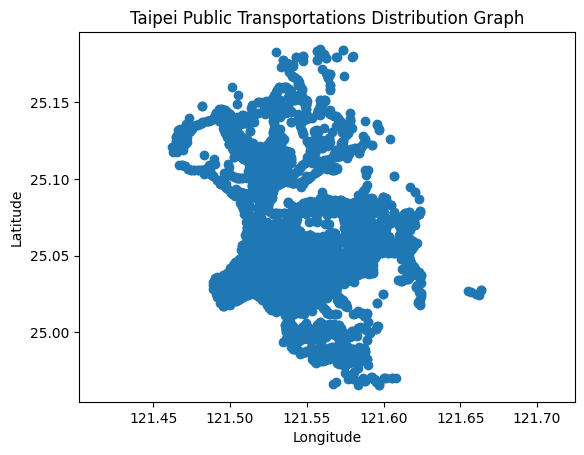

In [14]:
# Convert coordinates into numpy array
X = np.array(coords)

plt.plot(X[:, 0], X[:, 1], 'o')
plt.title('Taipei Public Transportations Distribution Graph')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.axis('equal')
plt.show()

### 結果觀察
+ 台北市Youbike基本遍布各處，而騎乘腳踏車可到大處多有捷運站
    + Youbike站 共 1252 處
    + 台北271.7997 km^2扣除山區約等於244 km^2/1252 
    $\approx 一個城市公園大小$
    $\approx 1/3764個新加坡$ (因為聽說新加坡是個走路就可以不小心走出國的地方，故以此做比)
+ 台北市公車設站3423個，其中有些公車站設於山上，可以到達些其他大眾交通工具無法到達處
+ 捷運設點75站、火車2站(台北、南港)